# MobileNet v2 - Transfer Learning

In [32]:
from tensorflow.keras import Model
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
from keras.callbacks import ModelCheckpoint

In [21]:
import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU')
print(physical_devices)
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    print("Failed to limit GPU Memory!")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## Gathering Data

In [22]:
!pwd

/Users/sankeerthana/Documents/NTU/YEAR_3/CZ3002_ASE/Lab/runs/transfer_learning_try1


In [23]:
train_path = '/Users/sankeerthana/Documents/NTU/YEAR_3/CZ3002_ASE/Lab/flowers_dataset_try2/train/'
val_path = '/Users/sankeerthana/Documents/NTU/YEAR_3/CZ3002_ASE/Lab/flowers_dataset_try2/val/'
test_path = '/Users/sankeerthana/Documents/NTU/YEAR_3/CZ3002_ASE/Lab/flowers_dataset_try2/test/'

In [24]:
#initialising generator
train_generator = ImageDataGenerator(preprocessing_function=preprocess_input).flow_from_directory(train_path,target_size=(640,480), batch_size=30, class_mode="sparse")
val_generator = ImageDataGenerator(preprocessing_function=preprocess_input).flow_from_directory(val_path,target_size=(640,480), batch_size=20, class_mode="sparse")

Found 952 images belonging to 17 classes.
Found 272 images belonging to 17 classes.


In [25]:
print('train_generator.class_indices:\n',train_generator.class_indices)

train_generator.class_indices:
 {'bluebell': 0, 'buttercup': 1, 'colts_foot': 2, 'cowslip': 3, 'crocus': 4, 'daffodil': 5, 'daisy': 6, 'dandelion': 7, 'fritillary': 8, 'iris': 9, 'lily_valley': 10, 'pansy': 11, 'snowdrop': 12, 'sunflower': 13, 'tigerlilly': 14, 'tulip': 15, 'windflower': 16}


In [26]:
print('train_generator.labels:\n', train_generator.labels)
print("Dimension of labels:", len(train_generator.labels))

train_generator.labels:
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3
  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3  3
  3  3  3  3  3  3  3  3  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4
  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  4  5  5  5  5  5  5  5  5
  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5
  5  5  5  5  5  5  5  5  

In [27]:
base_model = MobileNetV2(weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dense(256, activation='relu')(x)
x = Dense(128, activation='relu')(x)
preds = Dense(17, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=preds)

Metal device set to: Apple M1


2022-02-22 13:40:24.230237: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-02-22 13:40:24.231310: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [28]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 Conv1 (Conv2D)                 (None, None, None,   864         ['input_1[0][0]']                
                                32)                                                               
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, None, None,   128         ['Conv1[0][0]']                  
                                32)                                                           

## Freeze Pretrained Layers

In [29]:
#grab all the layers except the last 5
for layers in model.layers[:-5]:
    layers.trainable = False

In [30]:
model.summary() #lesser number of parameters so this speeds up the process

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 Conv1 (Conv2D)                 (None, None, None,   864         ['input_1[0][0]']                
                                32)                                                               
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, None, None,   128         ['Conv1[0][0]']                  
                                32)                                                           

## Compile and Fit the Model

In [35]:
%cd transfer_learning_try2/

/Users/sankeerthana/Documents/NTU/YEAR_3/CZ3002_ASE/Lab/runs/transfer_learning_try2


In [37]:
epochs = 20
optimizer = Adam(learning_rate = 0.0001)
model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['sparse_categorical_accuracy'])

check_point = ModelCheckpoint(filepath='weights-improvement-{epoch:02d}-{val_sparse_cat_accuracy:.2f}.h5',
                                           monitor="val_sparse_categorical_accuracy", mode="max", save_best_only=True)

history = model.fit(train_generator, validation_data=val_generator, epochs=epochs,)

Epoch 1/20


2022-02-22 13:44:40.129527: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


32/32 [==============================] - ETA: 0s - loss: 2.6737 - sparse_categorical_accuracy: 0.2059

2022-02-22 13:45:06.605074: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


32/32 [==============================] - 34s 1s/step - loss: 2.6737 - sparse_categorical_accuracy: 0.2059 - val_loss: 2.4589 - val_sparse_categorical_accuracy: 0.4743
Epoch 2/20
32/32 [==============================] - 33s 1s/step - loss: 2.2725 - sparse_categorical_accuracy: 0.5410 - val_loss: 1.9732 - val_sparse_categorical_accuracy: 0.6912
Epoch 3/20
32/32 [==============================] - 33s 1s/step - loss: 1.7258 - sparse_categorical_accuracy: 0.7090 - val_loss: 1.3896 - val_sparse_categorical_accuracy: 0.7941
Epoch 4/20
32/32 [==============================] - 33s 1s/step - loss: 1.1979 - sparse_categorical_accuracy: 0.8130 - val_loss: 0.9912 - val_sparse_categorical_accuracy: 0.8603
Epoch 5/20
32/32 [==============================] - 37s 1s/step - loss: 0.8438 - sparse_categorical_accuracy: 0.8718 - val_loss: 0.7315 - val_sparse_categorical_accuracy: 0.8787
Epoch 6/20
32/32 [==============================] - 39s 1s/step - loss: 0.6382 - sparse_categorical_accuracy: 0.8981 - va

In [38]:
#saving whole model
model.save('transfer_learning_try2.h5')

/Users/sankeerthana/miniforge3/envs/ase/lib/python3.9/site-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


In [39]:
#saving architecture
import json

json_string = model.to_json()
out_file = open("architecture.json", "w") 
json.dump(json_string, out_file, indent = 6) 
out_file.close() 

In [40]:
#saving weights
model.save_weights('last_wts.h5')

In [41]:
print(history.history.keys())

dict_keys(['loss', 'sparse_categorical_accuracy', 'val_loss', 'val_sparse_categorical_accuracy'])


In [42]:
training_loss = history.history['loss']
validation_loss = history.history['val_loss']
training_accuracy = history.history['sparse_categorical_accuracy']
validation_accuracy = history.history['val_sparse_categorical_accuracy']
epochs = range(1,21)

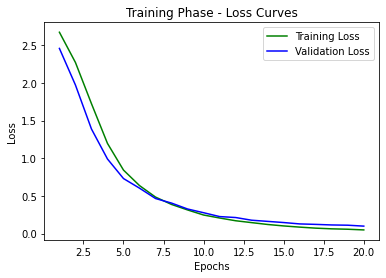

In [43]:
#Plotting the Loss Curves - Training and Validation
plt.plot(epochs, training_loss, 'g', label='Training Loss')
plt.plot(epochs, validation_loss, 'b', label='Validation Loss')
plt.title('Training Phase - Loss Curves')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

At Epoch 7 onwards, validation loss is greater than training loss, so can reduce the number of epochs to 8.

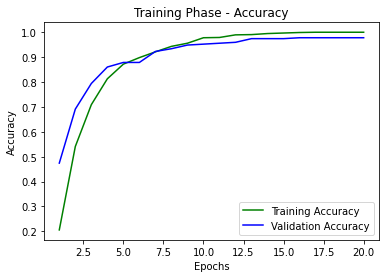

In [44]:
#Plotting the Loss Curves - Training and Validation
plt.plot(epochs, training_accuracy, 'g', label='Training Accuracy')
plt.plot(epochs, validation_accuracy, 'b', label='Validation Accuracy')
plt.title('Training Phase - Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

## Evaluating on Test Data

In [45]:
#Creating a Test generator
test_generator = ImageDataGenerator(preprocessing_function=preprocess_input).flow_from_directory(test_path,target_size=(640,480), batch_size=1, class_mode="sparse", shuffle=False)

Found 136 images belonging to 17 classes.


In [46]:
# Generate generalization metrics
score = model.evaluate(test_generator)
print(f'Test loss: {score[0]} / Test accuracy: {score[1]}')

136/136 [==============================] - 4s 28ms/step - loss: 0.0939 - sparse_categorical_accuracy: 0.9853
Test loss: 0.0939294621348381 / Test accuracy: 0.9852941036224365


## Inferencing on Test Data

In [47]:
STEP_SIZE_TEST = test_generator.n // test_generator.batch_size
test_generator.reset()
predictions = model.predict(test_generator, steps=STEP_SIZE_TEST, verbose=1)

2022-02-22 14:10:17.502726: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


136/136 [==============================] - 4s 25ms/step


In [48]:
import numpy as np
predicted_class_indices = np.argmax(predictions, axis=1)
predicted_class_indices

array([ 0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,  1,  1,  1,  1,  2,
        2,  2,  2,  2,  2,  2,  2,  3,  3,  3,  3,  3,  3,  3,  3,  4,  4,
        4,  4,  4,  4,  4,  4,  5,  5,  5,  5,  5,  5,  5,  5,  6,  6,  6,
        6,  6,  6,  6,  6,  7,  7,  7,  7,  7,  7,  7,  7,  8,  8,  8,  8,
        8,  8,  8,  8,  9,  9,  9,  9,  9,  9,  9,  9, 11, 10, 10, 10, 10,
       10, 10, 10, 11,  4, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12,
       12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14,
       14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16, 16, 16])

In [49]:
labels = train_generator.class_indices
print(labels)

{'bluebell': 0, 'buttercup': 1, 'colts_foot': 2, 'cowslip': 3, 'crocus': 4, 'daffodil': 5, 'daisy': 6, 'dandelion': 7, 'fritillary': 8, 'iris': 9, 'lily_valley': 10, 'pansy': 11, 'snowdrop': 12, 'sunflower': 13, 'tigerlilly': 14, 'tulip': 15, 'windflower': 16}


In [50]:
labels = dict((v,k) for k,v in labels.items())
predictions = [labels[k] for k in predicted_class_indices]

In [51]:
test_filenames = test_generator.filenames

## Helper Functions

In [52]:
def load_image(image_path):
    return tf.keras.preprocessing.image.load_img(
        image_path)

In [53]:
def image_to_array(image):
    return tf.keras.preprocessing.image.img_to_array(image, dtype=np.int32)

In [54]:
def display_image(image_np):
    plt.imshow(image_np)
    plt.show()

In [55]:
import os, sys

def plot_test_pred():
    os.chdir(test_path)
    for i in range(len(test_filenames)):
        test_image = load_image(test_filenames[i])
        test_image_array = image_to_array(test_image)
        print('Species:', predictions[i])
        display_image(test_image_array)

Species: bluebell


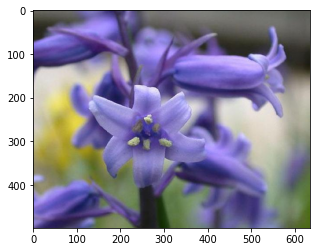

Species: bluebell


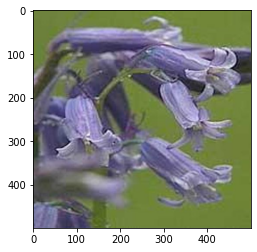

Species: bluebell


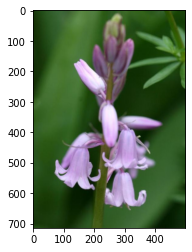

Species: bluebell


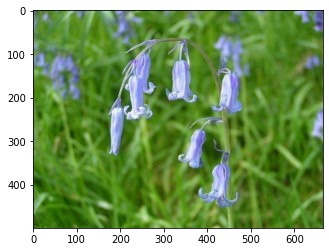

Species: bluebell


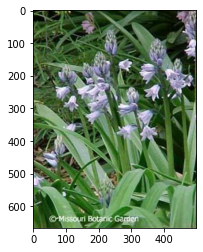

Species: bluebell


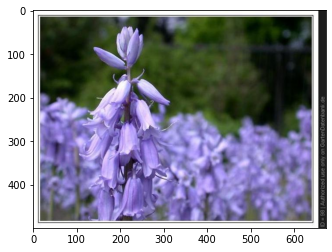

Species: bluebell


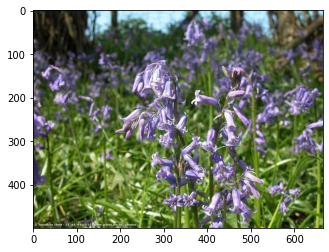

Species: bluebell


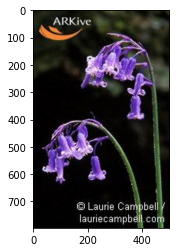

Species: buttercup


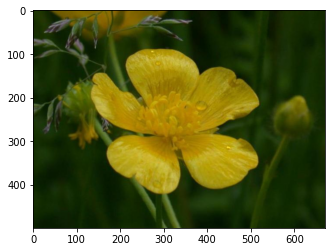

Species: buttercup


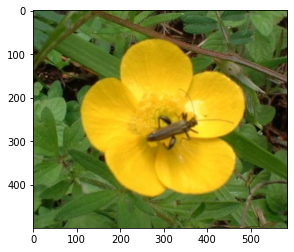

Species: buttercup


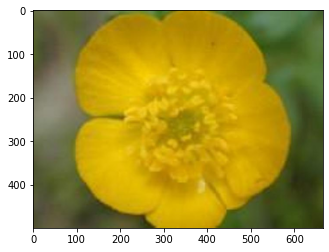

Species: buttercup


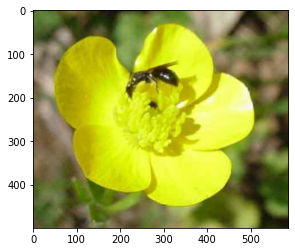

Species: buttercup


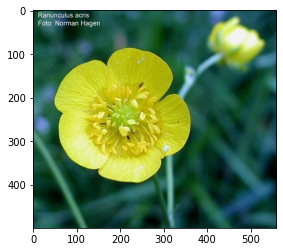

Species: buttercup


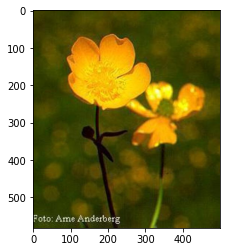

Species: buttercup


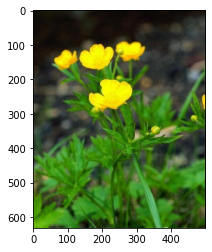

Species: buttercup


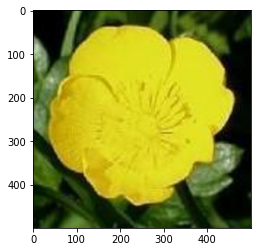

Species: colts_foot


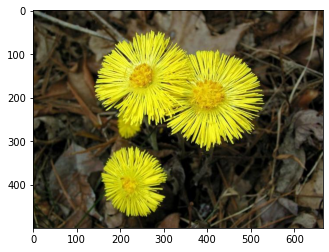

Species: colts_foot


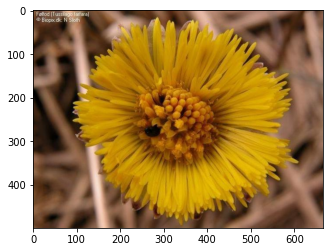

Species: colts_foot


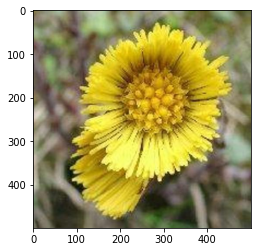

Species: colts_foot


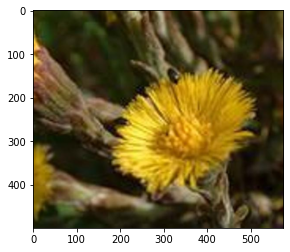

Species: colts_foot


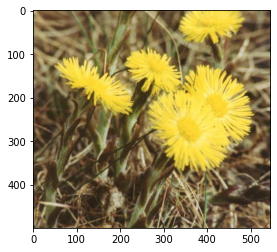

Species: colts_foot


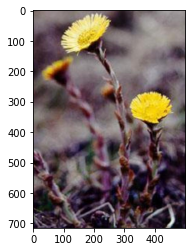

Species: colts_foot


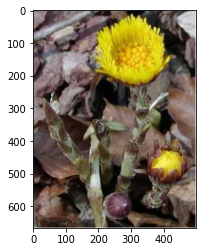

Species: colts_foot


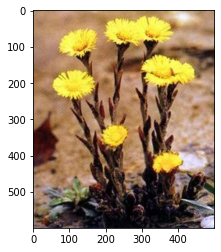

Species: cowslip


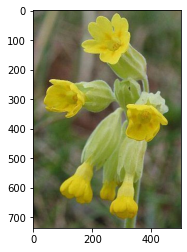

Species: cowslip


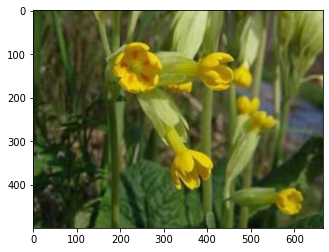

Species: cowslip


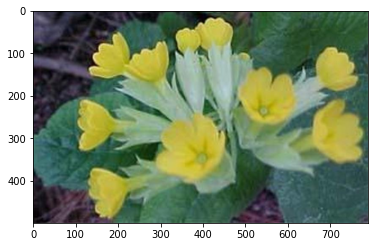

Species: cowslip


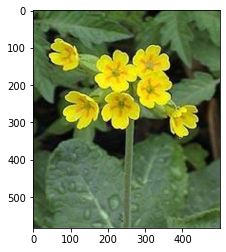

Species: cowslip


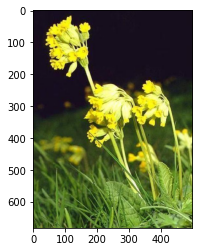

Species: cowslip


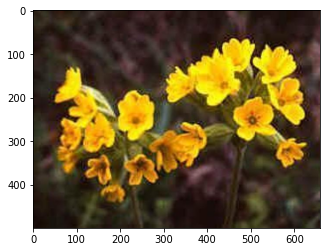

Species: cowslip


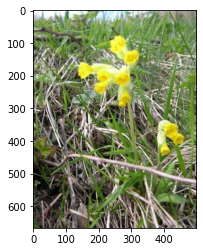

Species: cowslip


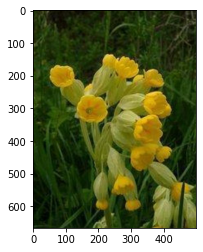

Species: crocus


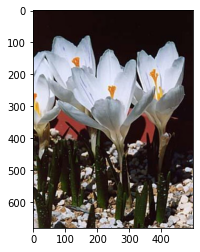

Species: crocus


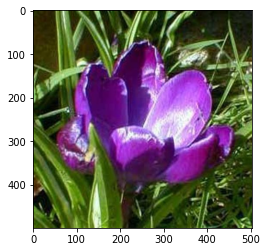

Species: crocus


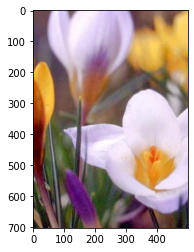

Species: crocus


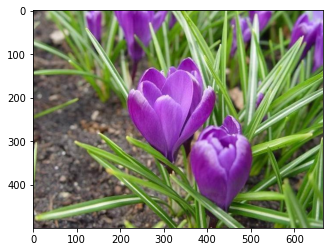

Species: crocus


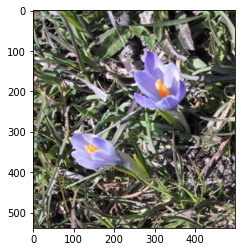

Species: crocus


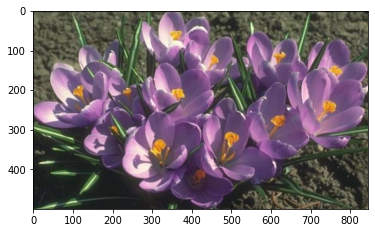

Species: crocus


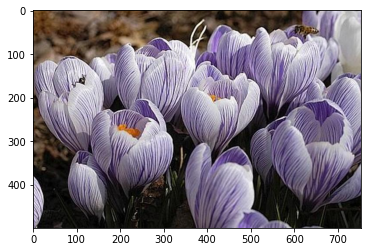

Species: crocus


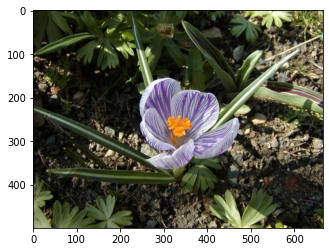

Species: daffodil


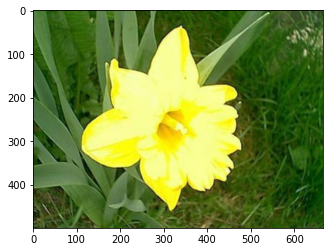

Species: daffodil


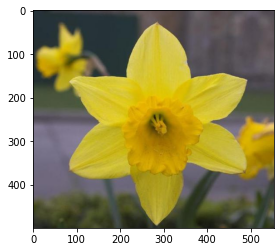

Species: daffodil


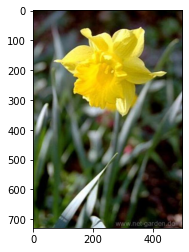

Species: daffodil


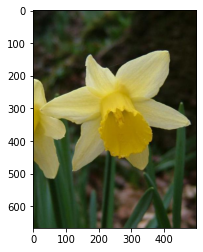

Species: daffodil


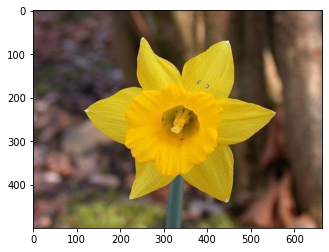

Species: daffodil


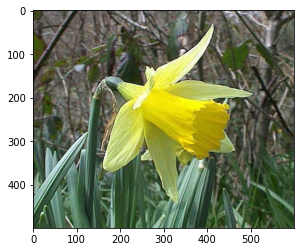

Species: daffodil


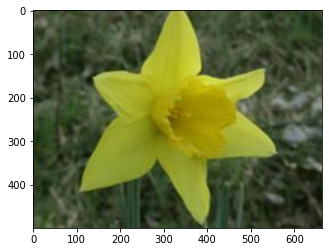

Species: daffodil


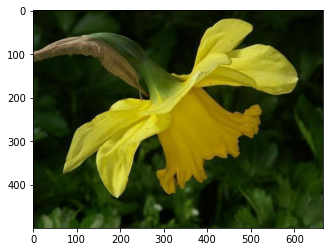

Species: daisy


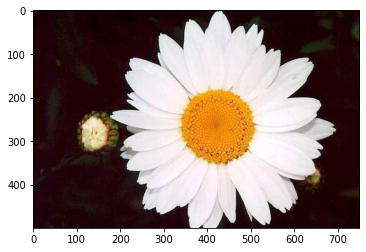

Species: daisy


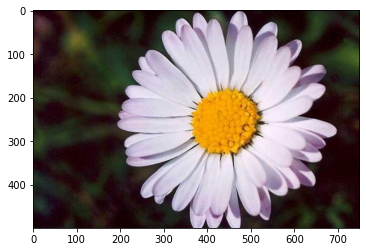

Species: daisy


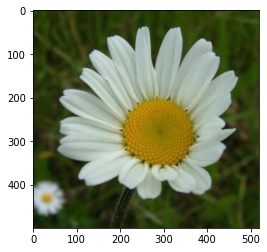

Species: daisy


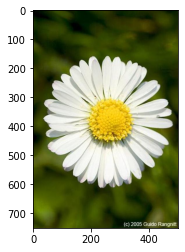

Species: daisy


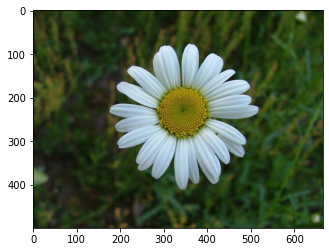

Species: daisy


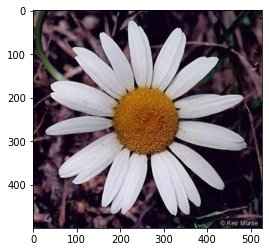

Species: daisy


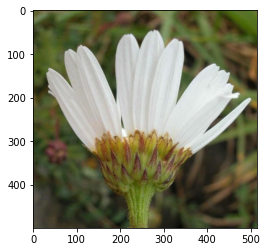

Species: daisy


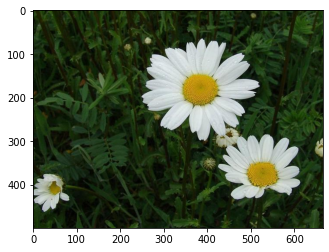

Species: dandelion


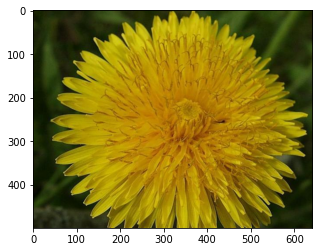

Species: dandelion


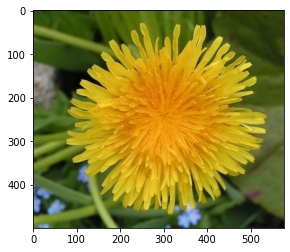

Species: dandelion


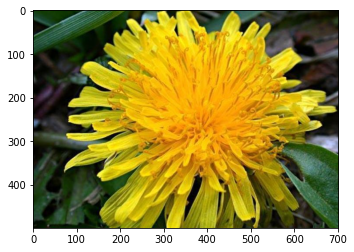

Species: dandelion


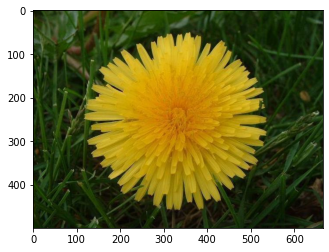

Species: dandelion


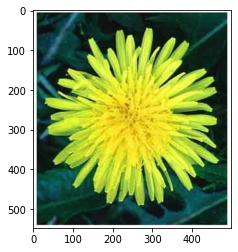

Species: dandelion


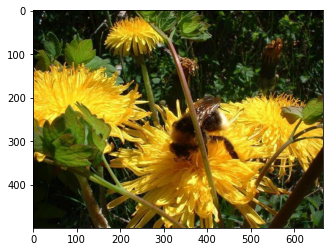

Species: dandelion


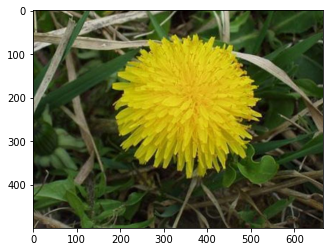

Species: dandelion


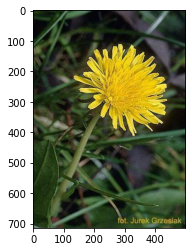

Species: fritillary


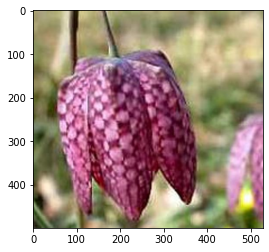

Species: fritillary


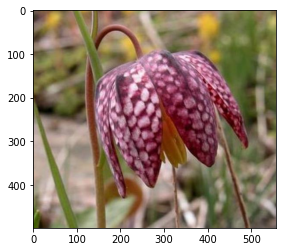

Species: fritillary


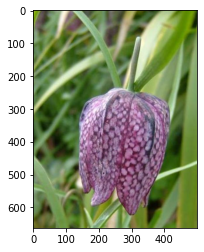

Species: fritillary


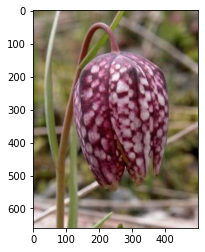

Species: fritillary


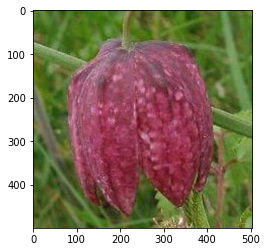

Species: fritillary


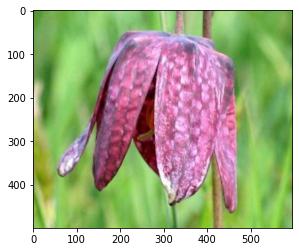

Species: fritillary


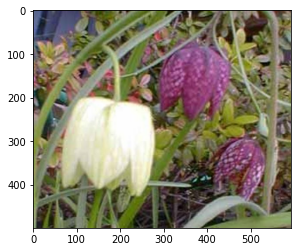

Species: fritillary


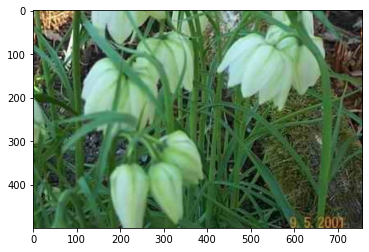

Species: iris


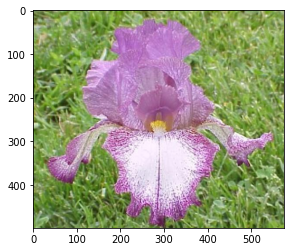

Species: iris


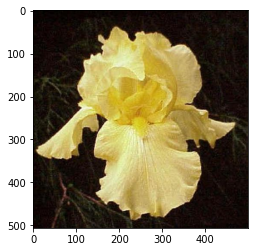

Species: iris


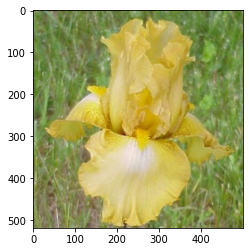

Species: iris


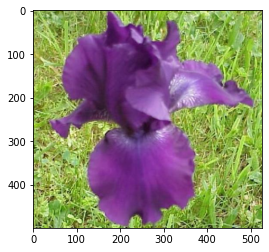

Species: iris


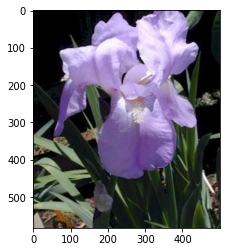

Species: iris


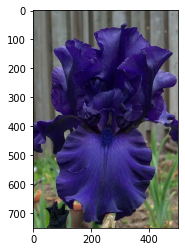

Species: iris


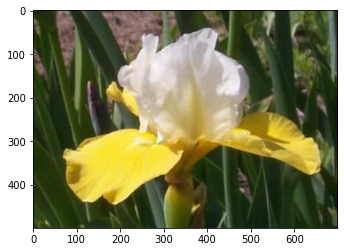

Species: iris


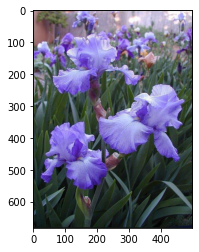

Species: pansy


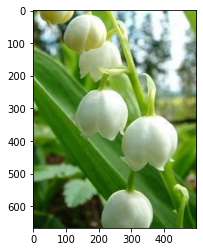

Species: lily_valley


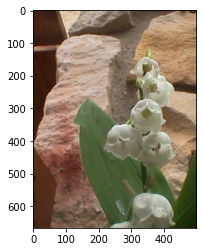

Species: lily_valley


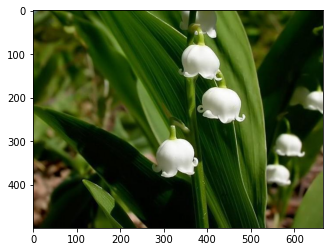

Species: lily_valley


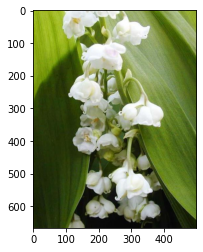

Species: lily_valley


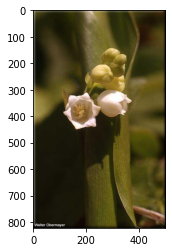

Species: lily_valley


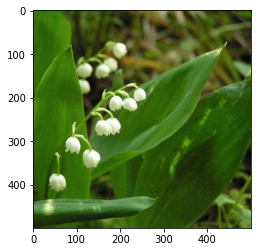

Species: lily_valley


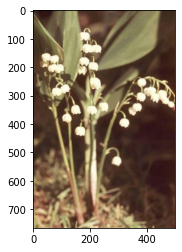

Species: lily_valley


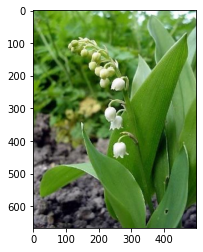

Species: pansy


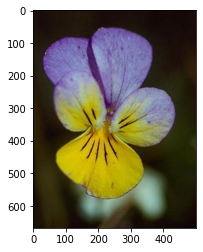

Species: crocus


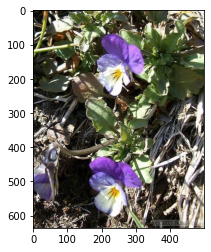

Species: pansy


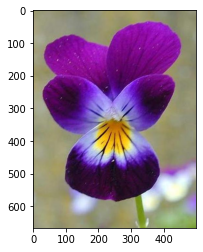

Species: pansy


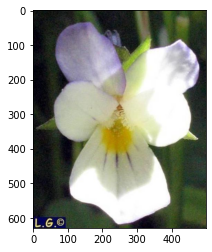

Species: pansy


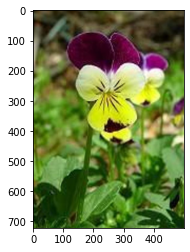

Species: pansy


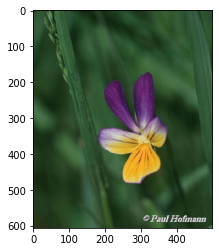

Species: pansy


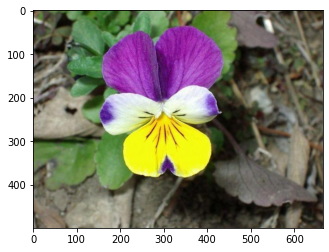

Species: pansy


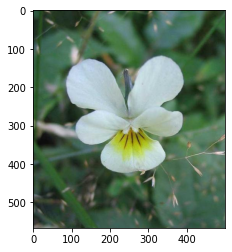

Species: snowdrop


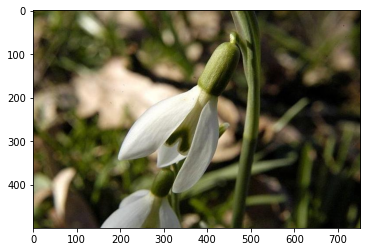

Species: snowdrop


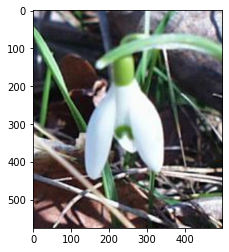

Species: snowdrop


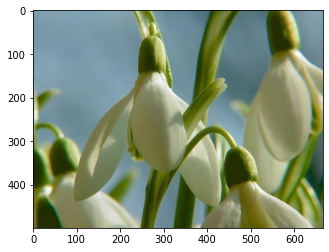

Species: snowdrop


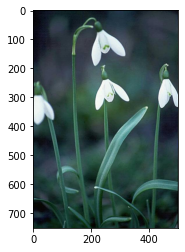

Species: snowdrop


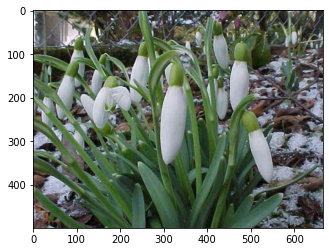

Species: snowdrop


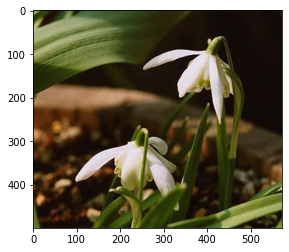

Species: snowdrop


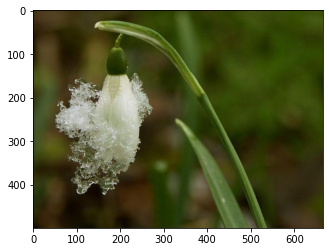

Species: snowdrop


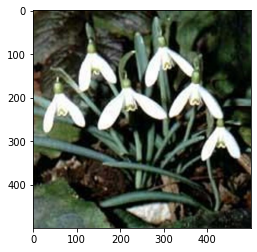

Species: sunflower


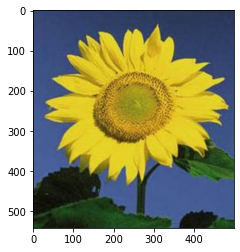

Species: sunflower


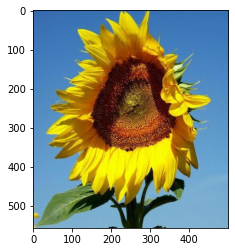

Species: sunflower


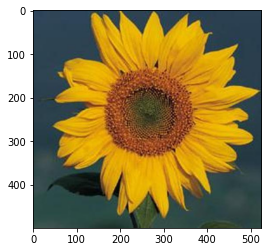

Species: sunflower


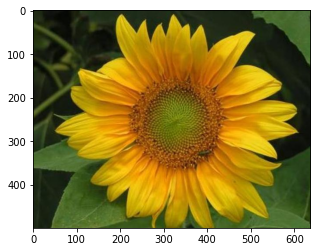

Species: sunflower


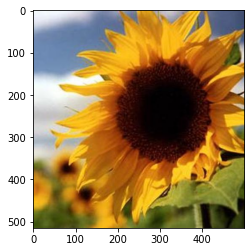

Species: sunflower


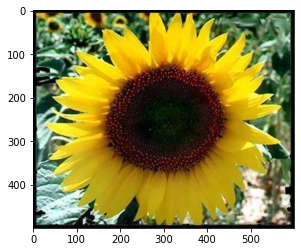

Species: sunflower


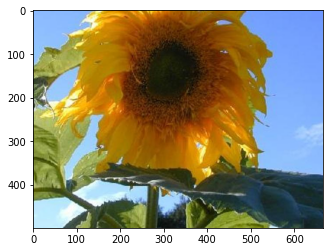

Species: sunflower


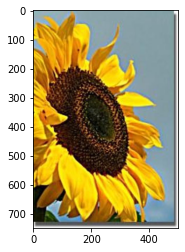

Species: tigerlilly


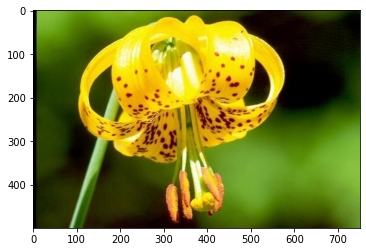

Species: tigerlilly


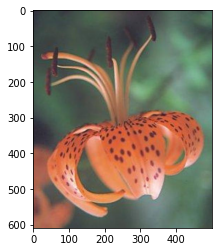

Species: tigerlilly


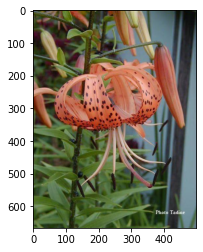

Species: tigerlilly


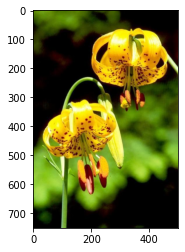

Species: tigerlilly


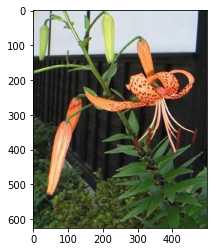

Species: tigerlilly


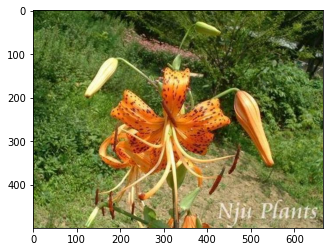

Species: tigerlilly


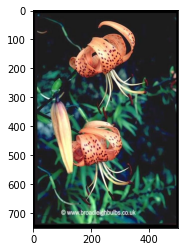

Species: tigerlilly


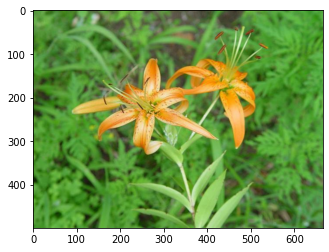

Species: tulip


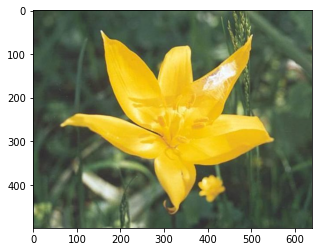

Species: tulip


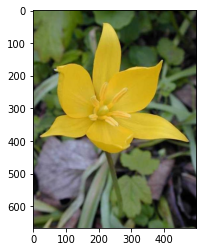

Species: tulip


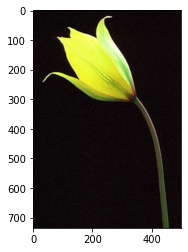

Species: tulip


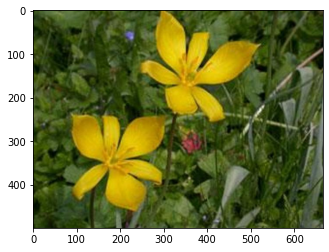

Species: tulip


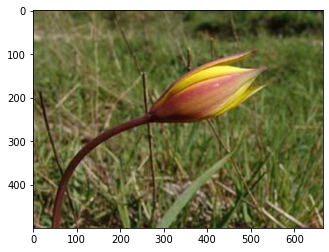

Species: tulip


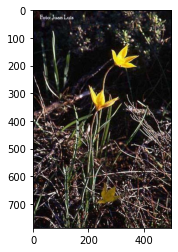

Species: tulip


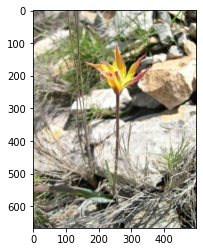

Species: tulip


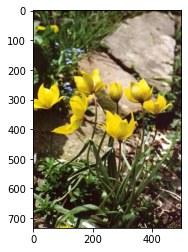

Species: windflower


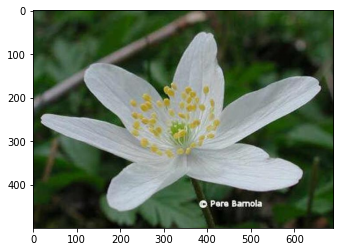

Species: windflower


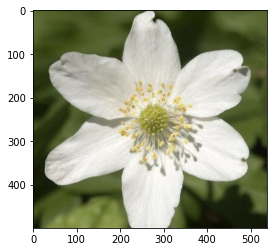

Species: windflower


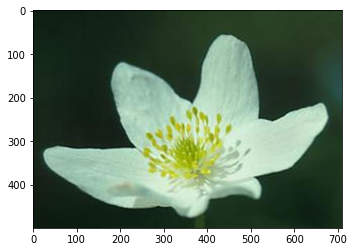

Species: windflower


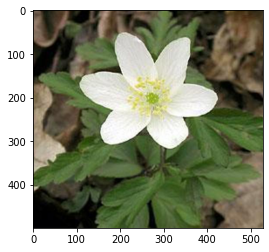

Species: windflower


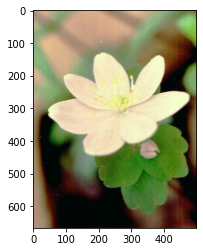

Species: windflower


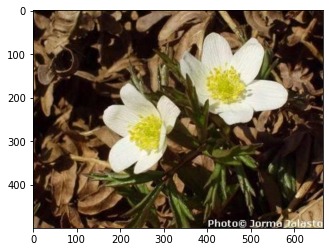

Species: windflower


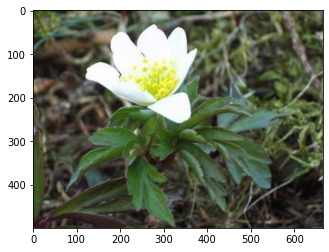

Species: windflower


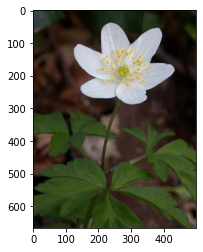

In [56]:
plot_test_pred()

In [57]:
import pandas as pd
file_names = test_generator.filenames
results = pd.DataFrame({"filenames":file_names, "predictions":predictions})
results.to_csv("results.csv", index=False)

In [58]:
!pwd

/Users/sankeerthana/Documents/NTU/YEAR_3/CZ3002_ASE/Lab/flowers_dataset_try2/test


In [164]:
#navigating to the correct folder
os.chdir('/Users/sankeerthana/Documents/NTU/YEAR_3/CZ3002_ASE/Lab/runs/transfer_learning_try1/')

## Try 2 - Run till 8 epochs

In [73]:
base_model = MobileNetV2(weights='imagenet', include_top=False)

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dense(256, activation='relu')(x)
x = Dense(128, activation='relu')(x)
preds = Dense(17, activation='softmax')(x)

model_1 = Model(inputs=base_model.input, outputs=preds)

In [75]:
#grab all the layers except the last 5
for layers in model_1.layers[:-5]:
    layers.trainable = False

In [76]:
model_1.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 Conv1 (Conv2D)                 (None, None, None,   864         ['input_2[0][0]']                
                                32)                                                               
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, None, None,   128         ['Conv1[0][0]']                  
                                32)                                                         

In [80]:
%cd transfer_learning_try3/

/Users/sankeerthana/Documents/NTU/YEAR_3/CZ3002_ASE/Lab/runs/transfer_learning_try3


In [86]:
import os
name = os.path.join(os.getcwd(),'weights-improvement-{epoch:02d}-{val_sparse_categorical_accuracy:.2f}.h5')
print(name)

/Users/sankeerthana/Documents/NTU/YEAR_3/CZ3002_ASE/Lab/runs/transfer_learning_try3/weights-improvement-{epoch:02d}-{val_sparse_categorical_accuracy:.2f}.h5


In [87]:
epochs = 8
optimizer = Adam(learning_rate = 0.0001)
model_1.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['sparse_categorical_accuracy'])

#saving the wts of the best perf
check_point_1 = ModelCheckpoint(filepath=name,monitor="val_sparse_categorical_accuracy", mode="max", save_best_only=True, save_weights_only=True)
callbacks_list = [check_point_1]
history_1 = model_1.fit(train_generator, validation_data=val_generator, epochs=epochs, callbacks=callbacks_list)

Epoch 1/8


2022-02-22 14:33:57.750748: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


32/32 [==============================] - ETA: 0s - loss: 1.4545 - sparse_categorical_accuracy: 0.7773

2022-02-22 14:34:24.210631: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


32/32 [==============================] - 34s 1s/step - loss: 1.4545 - sparse_categorical_accuracy: 0.7773 - val_loss: 1.2413 - val_sparse_categorical_accuracy: 0.8051
Epoch 2/8
32/32 [==============================] - 34s 1s/step - loss: 1.0775 - sparse_categorical_accuracy: 0.8382 - val_loss: 0.9339 - val_sparse_categorical_accuracy: 0.8640
Epoch 3/8
32/32 [==============================] - 35s 1s/step - loss: 0.7986 - sparse_categorical_accuracy: 0.8908 - val_loss: 0.7522 - val_sparse_categorical_accuracy: 0.8603
Epoch 4/8
32/32 [==============================] - 38s 1s/step - loss: 0.6118 - sparse_categorical_accuracy: 0.9128 - val_loss: 0.5797 - val_sparse_categorical_accuracy: 0.9265
Epoch 5/8
32/32 [==============================] - 40s 1s/step - loss: 0.4893 - sparse_categorical_accuracy: 0.9265 - val_loss: 0.4602 - val_sparse_categorical_accuracy: 0.9301
Epoch 6/8
32/32 [==============================] - 41s 1s/step - loss: 0.3851 - sparse_categorical_accuracy: 0.9569 - val_los

In [88]:
!pwd

/Users/sankeerthana/Documents/NTU/YEAR_3/CZ3002_ASE/Lab/runs/transfer_learning_try3


In [89]:
#saving whole model
model.save('transfer_learning_try3.h5')

/Users/sankeerthana/miniforge3/envs/ase/lib/python3.9/site-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


In [90]:
#saving architecture
import json

json_string = model.to_json()
out_file = open("architecture.json", "w") 
json.dump(json_string, out_file, indent = 6) 
out_file.close() 

In [97]:
training_loss_1 = history_1.history['loss']
validation_loss_1 = history_1.history['val_loss']
training_accuracy_1 = history_1.history['sparse_categorical_accuracy']
validation_accuracy_1 = history_1.history['val_sparse_categorical_accuracy']
epochs = range(1,9)

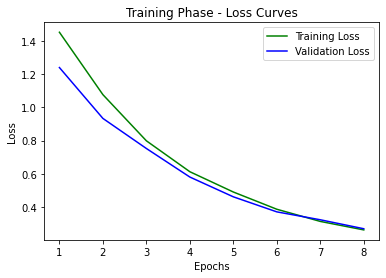

In [98]:
#Plotting the Loss Curves - Training and Validation
plt.plot(epochs, training_loss_1, 'g', label='Training Loss')
plt.plot(epochs, validation_loss_1, 'b', label='Validation Loss')
plt.title('Training Phase - Loss Curves')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

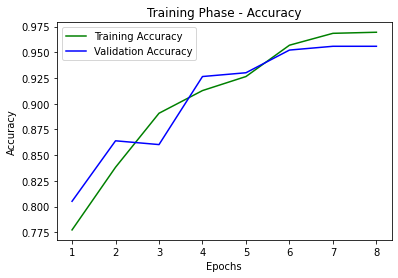

In [99]:
#Plotting the Loss Curves - Training and Validation
plt.plot(epochs, training_accuracy_1, 'g', label='Training Accuracy')
plt.plot(epochs, validation_accuracy_1, 'b', label='Validation Accuracy')
plt.title('Training Phase - Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

## Evaluating on Test

In [100]:
# Generate generalization metrics
score_1 = model_1.evaluate(test_generator)
print(f'Test loss: {score[0]} / Test accuracy: {score[1]}')

136/136 [==============================] - 4s 29ms/step - loss: 0.3157 - sparse_categorical_accuracy: 0.9559
Test loss: 0.0939294621348381 / Test accuracy: 0.9852941036224365
